# Data and Wavelet transform for ECG denoising

To deal with the wavelet transforms, we will use a library named PyWavelet. 
The data used here is **TB-XL ECG database** and the data processing is in the **Appendix Data selection** part of the notebook.
You will find only examples on 100Hz data, but the study was also on 500Hz data.

## Setup

In [4]:
!pip install -r requirements.txt

In [75]:
############
# Packages #
############
import os
import sys
import pickle
import scipy
import pywt
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import seaborn as sns
import matplotlib.pyplot as plt
from collections import Counter
from pathlib import Path
from itertools import product
from sklearn.metrics import mean_squared_error
from prettytable import PrettyTable
from typing import Dict, Union, List, Tuple, Any, Callable, Optional
pio.renderers.default = "plotly_mimetype+notebook"
###################
#   ploting st    #
###################
#Color
def my_pal(n):
    return sns.color_palette("Spectral", n).as_hex()

#Simple
def plot_signal(vec, title = "signal"):
    fig = px.line(vec, template = "plotly_dark", title = title)
    fig.show()

def plot_all_st(X, clustering=None, title="<b>Signals</b>"):
    """
    Plot multiple signals in a single interactive Plotly figure.

    Args:
        X (list of arrays): A list of signal arrays to be plotted.
        clustering (list or None, optional): A list of cluster assignments for each signal. 
            If provided, signals will be color-coded by cluster. Default is None.
        title (str, optional): The title of the plot. Default is "<b>Signals</b>".

    Returns:
        None: Displays an interactive Plotly figure with the plotted signals.
    """
    
    fig = go.Figure(
        layout=go.Layout(
            height=600, 
            width=800, 
            template = "plotly_dark", 
            title = title
    ))
        
    if clustering:
        pal = ["palegreen", "darkred"]
    else:
        pal = sns.color_palette("Spectral", len(X)).as_hex()

    for i in range(len(X)):
        if clustering:
            color = pal[clustering[i]]
        else:
            color = pal[i]
            
        fig.add_trace(go.Scatter(y=X[i], 
                                 mode="lines", 
                                 line=dict(
                                     width=2,
                                     color=color,
                                 ),
                                 opacity = 0.6
                                ))
    fig.show()

# Constructor
def add_fig(fig, signal, color, name):
    fig.add_trace(go.Scatter(y=signal, 
                 mode="lines", 
                 line=dict(
                     width=2,
                     color=color,
                 ),
                 opacity = 0.6,
                 name=name
                )
             )
    

#Two signals compairison
def plot_estim(xb, true_x, title = "estimate xbar"):
    fig = go.Figure(
        layout=go.Layout(
            height=600, 
            width=800, 
            template = "plotly_dark", 
            title = title
    ))
    pal = my_pal(4)

    add_fig(fig, xb, "darkorchid" ,f"Estimation")
    add_fig(fig, true_x, "palegreen" ,f"Signal")
    fig.show()

##################
#   Scalogram    #
##################
def plot_scalogram(sig, scales, 
                 waveletname = 'cmor', 
                 levels = np.linspace(1e-1, 3, 40),
                 title = 'Scalogram of signal', 
                 fs = 500,
                 cmap = plt.cm.plasma, 
                 ):
    plt.clf()
    dt = 1/fs
    n = sig.shape[0]
    time = np.arange(0, n)/fs
    [coefficients, frequencies] = pywt.cwt(sig, scales, waveletname, dt)
    power = (abs(coefficients)) ** 2
    period = 1. / frequencies

    
    contourlevels = np.log2(levels)
    
    fig, ax = plt.subplots(figsize=(6, 5))
    im = ax.contourf(time, np.log2(period), np.log2(power), contourlevels, extend='both',cmap=cmap)
    
    ax.set_title(title, fontsize=10)
    ax.set_ylabel("Log period (s)", fontsize=8)
    
    ax.set_xlabel("Time (s)", fontsize=8)
    
    yticks = 2**np.arange(np.ceil(np.log2(period.min())), np.ceil(np.log2(period.max())))

    ax.set_yticks(np.log2(yticks))
    ax.set_yticklabels(yticks)

    ax.invert_yaxis()
    ylim = ax.get_ylim()
    ax.set_ylim(ylim[0], -1)


def plot_scalogram_freq(sig, scales, 
                 waveletname = 'cmor', 
                 levels = np.linspace(1e-2, 1, 40),
                 title = 'Scalogram of signal', 
                 fs = 500,
                 cmap = plt.cm.plasma, 
                 ):
    plt.clf()
    dt = 1/fs
    n = sig.shape[0]
    time = np.arange(0, n)/fs
    [coefficients, frequencies] = pywt.cwt(sig, scales, waveletname, dt)
    power = (abs(coefficients)) ** 2

    contourlevels = np.log2(levels)
    
    fig, ax = plt.subplots(figsize=(6, 5))
    im = ax.contourf(time, np.log2(frequencies), np.log2(power), contourlevels, extend='both',cmap=cmap)
    
    ax.set_title(title, fontsize=10)
    ax.set_ylabel("Log2 Frequencies (f)", fontsize=8)
    
    ax.set_xlabel("Time (s)", fontsize=8)
    
    yticks = 2**np.arange(np.ceil(np.log2(frequencies.min())), np.ceil(np.log2(frequencies.max())))

    ax.set_yticks(np.log2(yticks))
    ax.set_yticklabels(yticks)

    ax.invert_yaxis()
    ylim = ax.get_ylim()
    ax.set_ylim(ylim[0], -1)

    plt.show()

####################################
#   Wavelet mothers and Fathers    #
####################################

def add_fig_continuous(level, w, fig, signal, color, wave):
    psi, x = w.wavefun(level=level)
    if not w.complex_cwt:
        add_fig(fig, psi, color, f"{wave} wavelet continuous function psi")
    else:
        add_fig(fig, np.real(psi), color, f"{wave} wavelet continuous function psi real part")

def add_fig_discret_ortho(level, w, fig, signal, color, wave):
    (phi, psi, x) = w.wavefun(level=level)
    add_fig(fig, phi, color, f"{wave} scaling function phi")
    add_fig(fig, psi, color, f"{wave} wavelet function psi")

def add_fig_discret_biortho(level, w, fig, signal, color, wave):
    (phi_d, psi_d, phi_r, psi_r, x) = w.wavefun(level=level)
    add_fig(fig, phi_d, color, f"{wave} decomposition scaling phi_d")
    add_fig(fig, psi_d, color, f"{wave} decomposition wavelet psi_d")
    add_fig(fig, phi_r, color, f"{wave} reconstruction scaling phi_r")
    add_fig(fig, psi_r, color, f"{wave} reconstruction wavelet psi_r")

def plot_one_wave(level, type, iscontinous = False):
    pal = my_pal(5)
    fig = go.Figure(
        layout=go.Layout(
            height=600, 
            width=800, 
            template = "plotly_dark", 
            title = f"Wavelets {type}"
    ))
    
    wave = type
    print(wave)
    w = pywt.DiscreteContinuousWavelet(wave)
    if iscontinous:
        # w = pywt.ContinuousWavelet(wave)
        add_fig_continuous(level, w, fig, signal, pal[0], wave)
    else:
        # w = pywt.Wavelet(wave)
        if w.orthogonal:
            add_fig_discret_ortho(level, w, fig, signal, pal[0], wave)
        else:
            add_fig_discret_biortho(level, w, fig, signal, pal[0], wave)
    fig.update_layout(title = w.family_name + f" code={type}  level = {level} ")
    fig.show()    

def plot_wave_family(level, type, iscontinous = False):
    lst_wave = pywt.wavelist(type)
    nwave = len(lst_wave)
    pal = my_pal(nwave)
    fig = go.Figure(
        layout=go.Layout(
            height=600, 
            width=800, 
            template = "plotly_dark", 
            title = f"Wavelets {type}"
    ))
    
    for i in range(nwave):
        wave = lst_wave[i]
        w = pywt.DiscreteContinuousWavelet(wave)
        if iscontinous:
            # w = pywt.ContinuousWavelet(wave)
            add_fig_continuous(level, w, fig, signal, pal[i], wave)
        else:
            # w = pywt.Wavelet(wave)
            if w.orthogonal:
                add_fig_discret_ortho(level, w, fig, signal, pal[i], wave)
            else:
                add_fig_discret_biortho(level, w, fig, signal, pal[i], wave)

    fig.update_layout(title = w.family_name + f" code={type}  level = {level} ")
    fig.show()

##################
#   DWT plots    #
##################

def plot_decomposition(wave, title=f"Wavelets multilevel reconstruction"):
    coeffs = pywt.wavedec(signal, w)
    fig = go.Figure(
        layout=go.Layout(
            height=600, 
            width=800, 
            template = "plotly_dark", 
            title = title
    ))
    pal = my_pal(len(coeffs))
    
    coeffs2 = [np.zeros_like(coeff) for coeff in coeffs]

    for i,coeff in enumerate(coeffs):
        coeffs2[i] = coeff
        add_fig(fig, pywt.waverec(coeffs2, wave), pal[i] ,f"add coeff {i}")
    fig.show()

### Data loading

In [13]:
###!!!!!!!!! TO ADAPT IF ERROR!
root_path = Path(os.getcwd())
###!!!!!!!!!!!!!!!!!!!!!!!!!!!!

load_path = root_path.joinpath("data", "raw_data", "csv_data")

df_signals = pd.read_csv(load_path.joinpath("train_signal.csv"))
df_meta = pd.read_csv(load_path.joinpath("train_meta.csv"))

## Data exploration

#### Collection
The PTB-XL ECG dataset is a large dataset of 21837 clinical 12-lead ECGs from 18885 patients of 10 second length. 
The raw waveform data was annotated by up to two cardiologists, who assigned potentially multiple ECG statements to each record. 
The in total 71 different ECG statements conform to the SCP-ECG standard and cover diagnostic, form, and rhythm statements. 
Collected with devices from Schiller AG over the course of nearly seven years between October 1989 and June 1996. 

#### Identification
- ecg_id
- patient_id

#### Composition

##### Signals of EEG:
For each ecg_id there is 12 signals(I, II, III, AVL, AVR, AVF, V1, …, V6) with reference electrodes on the right arm.
The signals are stored in WaveForm DataBase (WFDB) format with 16 bit precision at a resolution of 1μV/LSB. 

Records | Superclass | Description
9528 | NORM | Normal ECG
5486 | MI | Myocardial Infarction
5250 | STTC | ST/T Change
4907 | CD | Conduction Disturbance
2655 | HYP | Hypertrophy

In [ ]:
df_signals = pd.read_csv(load_path.joinpath(f"train_signal.csv"))
df_meta = pd.read_csv(load_path.joinpath(f"train_meta.csv"))

In [14]:
df_meta.describe()

,ecg_id,age,sex,height,weight,nurse,site,NORM,MI,STTC,...,sub_ISC_,sub_SEHYP,sub_ISCI,sub_CRBBB,sub_CLBBB,sub_LAO/LAE,sub_ILBBB,sub_WPW,sub_PMI,strat_fold
count,17441.000000,17379.000000,17441.000000,5561.000000,7240.000000,16386.000000,17426.000000,17441.000000,17441.000000,17441.000000,...,17441.000000,17441.000000,17441.000000,17441.000000,17441.000000,17441.000000,17441.000000,17441.000000,17441.000000,17441.000000
mean,11150.875179,59.637091,0.478012,166.689085,70.695994,2.237703,1.432457,0.436156,0.251648,0.240411,...,0.058483,0.001376,0.018233,0.024827,0.024540,0.019609,0.003555,0.003670,0.000745,4.498194
std,6306.776661,16.824506,0.499531,10.845145,15.850132,3.288147,4.156018,0.495921,0.433973,0.427345,...,0.234661,0.037071,0.133796,0.155601,0.154722,0.138656,0.059518,0.060467,0.027292,2.291140
min,1.000000,2.000000,0.000000,6.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,5717.000000,50.000000,0.000000,160.000000,60.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
50%,11203.000000,61.000000,0.000000,166.000000,70.000000,1.000000,1.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000
75%,16635.000000,72.000000,1.000000,174.000000,80.000000,3.000000,2.000000,1.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000
max,21836.000000,95.000000,1.000000,209.000000,210.000000,11.000000,50.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,8.000000


In [89]:
def df_nan_percent(df: pd.DataFrame) -> pd.DataFrame:
    """
    Calcule le pourcentage de valeurs manquantes dans chaque colonne d'un DataFrame.

    Args:
        df (pd.DataFrame): DataFrame contenant les données.

    Returns:
        pd.DataFrame: DataFrame contenant le pourcentage de valeurs manquantes pour chaque colonne.
    """
    part_nan = df.isnull().mean()
    perc_nan = pd.DataFrame(np.round(100 * part_nan.to_numpy(), 1))
    perc_nan.index = part_nan.index
    return perc_nan

In [90]:
df_nan_percent(df_meta)

,0
ecg_id,0.0
age,0.4
sex,0.0
height,68.1
weight,58.5
nurse,6.0
site,0.1
device,0.0
NORM,0.0
MI,0.0


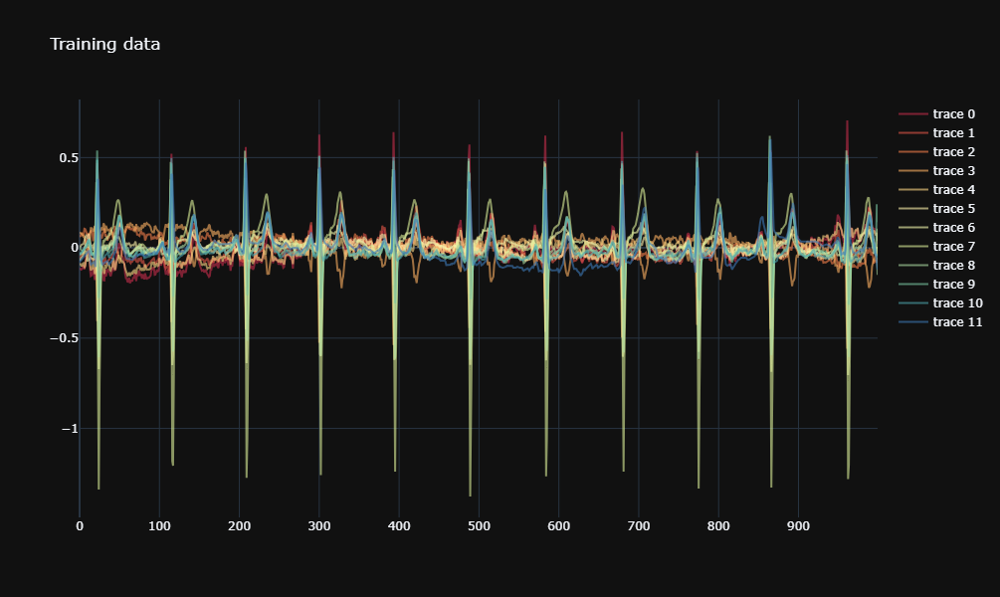

In [31]:
signals0 = df_signals.loc[df_signals["ecg_id"]==1, :].iloc[:,1:]
signal = signals0.to_numpy()[:,0].squeeze()
scales = np.arange(1, 256, 4)

plot_all_st(signals0.to_numpy().T, title="Training data")

## Denoising Study

We'll be focusing on different methods using the discrete wavelet transform for signal compression or denoising. The general approach is to calculate the coefficients of a discrete wavelet transform (DWT) of the original signal, then use a threshold to retain only the coefficients of the highest norm. In this way, we aim to retain most of the relevant information and remove the noise.

We will compare different methods of signal denoising. The main parameters of wavelet filtering are : 
- The mother wavelet
- The thresholding method 
- Thresholding parameters

We present each threshold method and compare different mother wavelets and threshold values. To estimate whether a reconstructed signal has retained the relevant information and removed the noise, we'll use a graphical criterion.

### Wavelet Selection 

The first step is to study the various possible decomposition bases. To illustrate the effect of the choice of the mother wavelet, we can take the example of the Haar and Daubechies bases. See the Appendix to have a complete view on the existing bases.

haar


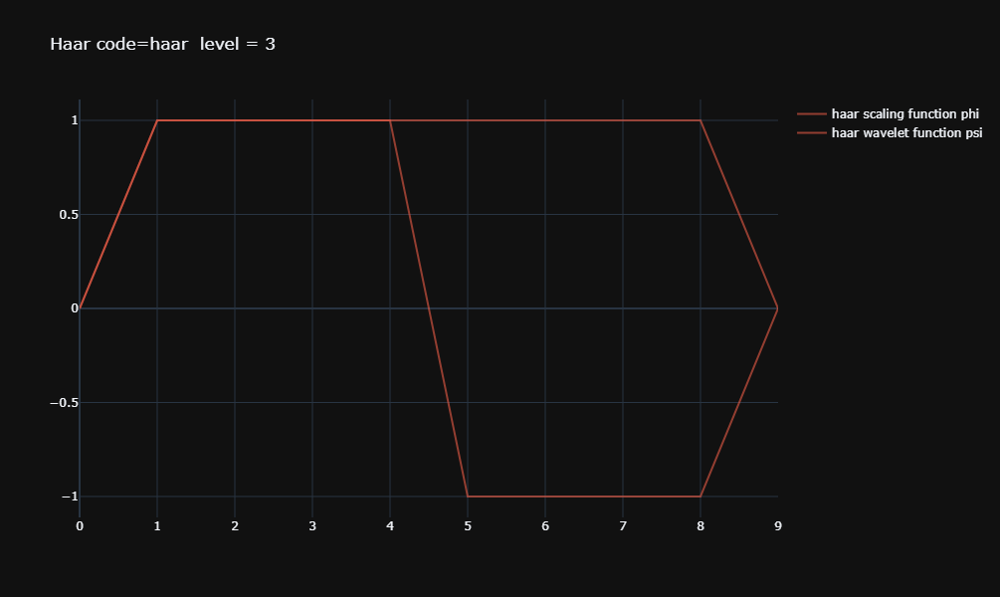

In [6]:
wavename = "haar"
plot_one_wave(level=3, type=wavename)

db5


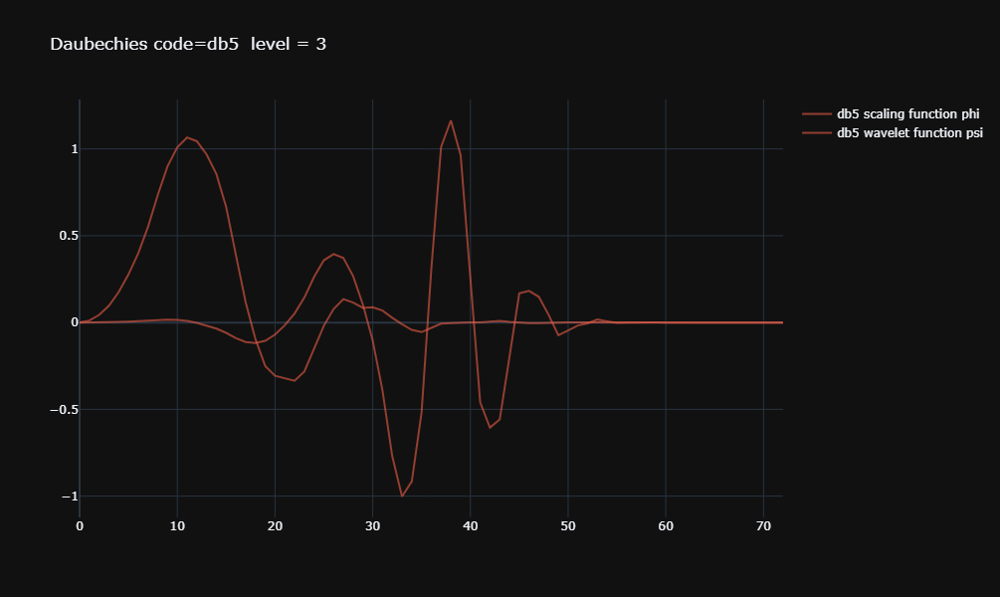

In [7]:
wavename = "db5"
plot_one_wave(level=3, type=wavename)

### The Data 

The signal of the first electrode of the first patient is as follow.

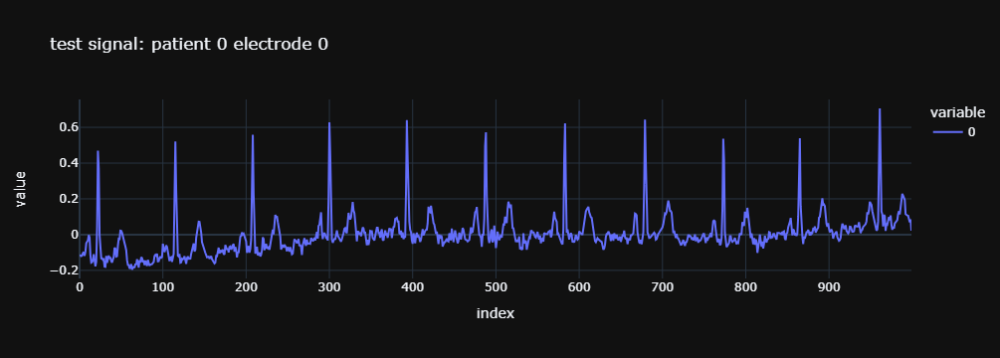

In [29]:
plot_signal(signal, title = "test signal: patient 0 electrode 0")

Let's plot the scalogram of this signal. The scalograme gives the square of the modulus of the wavelet transforms which is the equivalent of the power spectrum.

C:\Users\samud\anaconda3\envs\MVA2\lib\site-packages\pywt\_cwt.py:117: FutureWarning:

Wavelets from the family cmor, without parameters specified in the name are deprecated. The name should takethe form cmorB-C where B and C are floats representing the bandwidth frequency and center frequency, respectively (example: cmor1.5-1.0).



<Figure size 640x480 with 0 Axes>

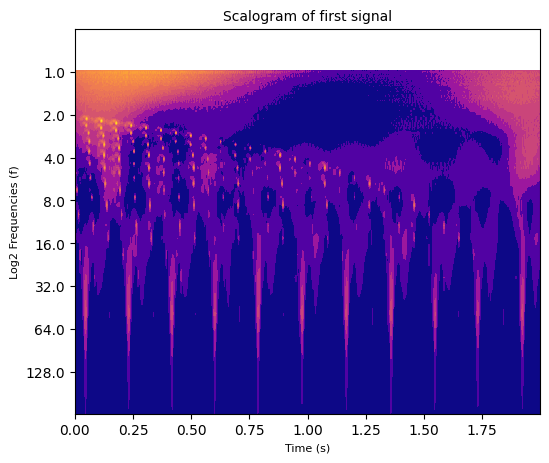

In [42]:
plot_scalogram_freq(signal, scales, waveletname = 'cmor', title = f"Scalogram of first signal", levels = np.linspace(1e-2, 1, 40))

As you can see, R singularities repeat periodically for frequencies slightly above 1Hz and is liked to very high-frequency patterns(above 16Hz).
The Frequency Scalogram detects periodic patterns up to 16Hz, which may correspond to P and T patterns. It is difficult to identify the noise, and it may be part of the blur between 1Hz and 16Hz.

### Different metrics used

Certain quantitative metrics can be used to help us select a denoising method. However, only a qualitative assessment of the reconstruction in relation to the diagnostic methods can lead to truly relevant denoising.
- **peak signal-to-noise ratio (PSNR)** is used in image denoising and compare MSE to the maximum intensity
- **normalised_mse** compares the MSE to signal standard error
- **compression_ratio** compares the size of the original signal to its representation. It is a measure of compression.
- **zero_ratio_tun_moe** gives the proportion of zeros in the representation, and thus give a measure of sparsity.
- **entropy** The entropy is the average level of "information", "surprise", or "uncertainty".

In [51]:
def calculate_psnr(signal, newsignal):
    """"Calculating peak signal-to-noise ratio (PSNR) between two signals."""
    mse = np.mean((signal - newsignal) ** 2)
    if mse == 0:
        return 100
    return np.round(20 * np.log10(max(signal) / (np.sqrt(mse))),1)

def compression_ratio(signal, coeffs):
    sig_size = signal.shape[0]
    wavelet_size = 0
    for coeff in coeffs:
        wavelet_size += np.sum(coeff!=0)
    return np.round(sig_size/wavelet_size,1)

def normalised_mse(original_signal, reconstructed_signal):
    original_signal = np.array(original_signal)
    reconstructed_signal = np.array(reconstructed_signal)
    normalised_original_signal = (original_signal - original_signal.mean())/original_signal.std()
    normalised_reconstructed_signal = (reconstructed_signal - reconstructed_signal.mean())/reconstructed_signal.std()
    return np.round(mean_squared_error(normalised_original_signal, normalised_reconstructed_signal),2)

def zero_ratio_tun_moe(original_coeffs, thresholded_coeffs):
    nb_of_coeffs = sum([len(coeff) for coeff in original_coeffs[1:]])
    nb_of_zeros = sum([(coeff==0).sum() for coeff in thresholded_coeffs[1:]])
    compression_ratio = (nb_of_coeffs - nb_of_zeros)/nb_of_coeffs
    return np.round(compression_ratio, 2)

def calculate_entropy(list_values):
    counter_values = Counter(list_values).most_common()
    probabilities = [elem[1]/len(list_values) for elem in counter_values]
    entropy=scipy.stats.entropy(probabilities)
    return entropy

def entropy(coeffs):
    lst_ent = [calculate_entropy(np.round(coeff,2)) for coeff in coeffs]
    return np.round(np.mean(lst_ent),1)
    

### Comparisons

In the following, we will denoise several signal by varying the threshold value and the mother wavelet. We will compare the results by considering the ease to recognise graphically the theoretical segmentation of an ECG signal. Additionally, we will discriminate our results using the compression ratios as measure of sparsity and compression, and normalised mean squared error. First we will focus on the hard thresholding. Secondly, we will study the soft thresholding and lastly, the proximal method for thresholding.

#### General functions

In [52]:
######################
#   Aux functions    #
######################

def round(arg):
    if isinstance(arg, str):
        return arg
    return np.round(arg,1)

## General step function
def denoise_and_metrics(sign, wavelet, args_filter, f_filter, fig = None, color = None, table=None ):
    #decomposition
    coeffs = pywt.wavedec(sign, wavelet, mode="per")
    original_coeffs = coeffs.copy()
    #filtration
    coeffs[1:] = (f_filter(coeff, *args_filter) for coeff in coeffs[1:])
    #reconstruction
    new_signal = pywt.waverec(coeffs, wavelet, mode="per" )
    #metrics
    pnsr = calculate_psnr(new_signal, sign)
    nmse = normalised_mse(sign, new_signal)
    cratio = compression_ratio(sign, coeffs)
    zratio = zero_ratio_tun_moe(original_coeffs, coeffs)
    ent = entropy(coeffs)
    #round parameters for plotting
    args_filter_round = tuple((round(argf) for argf in args_filter))
    if fig:
        add_fig(fig, new_signal, color ,f"{wavelet} {args_filter_round}")
    if table:
        table.add_row([wavelet]+ list(args_filter_round)+[pnsr, nmse, cratio, zratio, ent])
    return pnsr, nmse, cratio, zratio,ent

## General plot function
def plot_wave_rec(sign, lst_args, f_filter, title = f"Low pass", table = None):
    pal = my_pal(len(list(lst_args))+1)
    fig = go.Figure(
        layout=go.Layout(
            height=600, 
            width=1100, 
            template = "plotly_dark", 
            title = title
    ))
    add_fig(fig, sign, pal[-1], "Initial signal")
    
    k = 0
    for k, wave_args in enumerate(lst_args):
        wave = wave_args[0]
        args = wave_args[1:]
        denoise_and_metrics(sign, wave, args, f_filter=f_filter, fig = fig, color = pal[k], table=table) 
        
    fig.show()
    if table:
        print(table)

#### Hard thresholding

In [53]:
##################
#   Functions    #
##################
# Thresholding function
def my_threshold(coeff, arg0, arg1):
    return pywt.threshold(coeff, value=arg0, mode=arg1 )

def plot_wave_rec_lowpass(sign, waves, thres, modes, name = "signal 0"):
    lst_args = list(product(waves, thres, modes))
    table1 = PrettyTable([
        "Mother wavelet", 
        "Threshold value", 
        "Threshold method", 
        "Peak signal-to-noise ratio", 
        "Normalised MSE", 
        "Compression Ratio",
        "Zero ratio Tun Moe",
        "Entropy"
    ])
    plot_wave_rec(
        sign,
        lst_args, 
        title = f"<b>Low pass filtering {name}</b><br>threshold mode", 
        f_filter = my_threshold,
        table = table1
    )

We start by the simplest wavelet, the Haar wavelet. While Haar wavelet is simple, it has poor regularity. Indeed the function is not continuous.

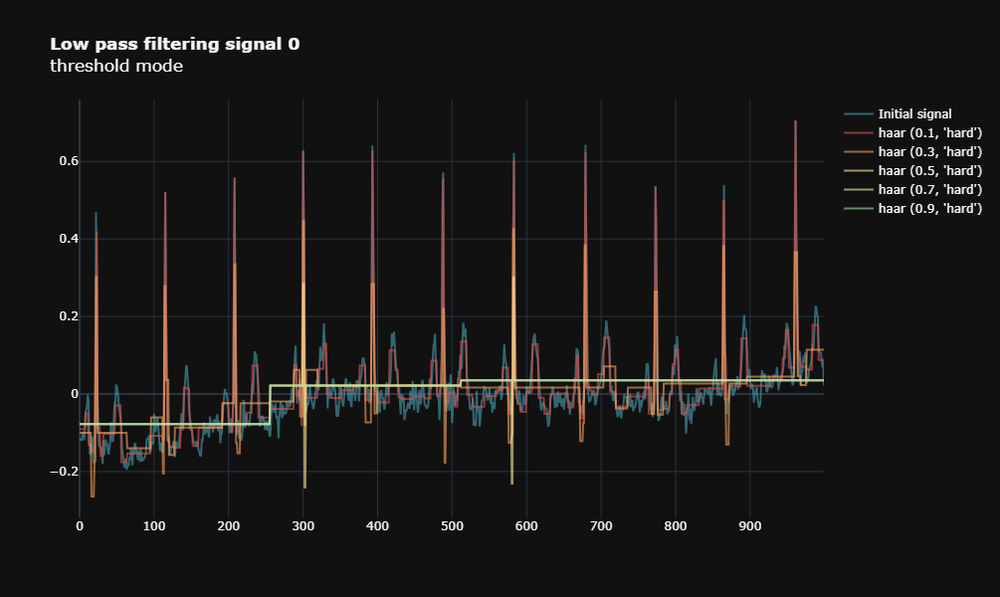

+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+
| Mother wavelet | Threshold value | Threshold method | Peak signal-to-noise ratio | Normalised MSE | Compression Ratio | Zero ratio Tun Moe | Entropy |
+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+
|      haar      |       0.1       |       hard       |            27.8            |      0.07      |        7.4        |        0.13        |   1.3   |
|      haar      |       0.3       |       hard       |            16.1            |      0.46      |        31.2       |        0.03        |   0.5   |
|      haar      |       0.5       |       hard       |            9.9             |      1.04      |       200.0       |        0.0         |   0.1   |
|      haar      |       0.7       |       hard       |            -9.0           

In [54]:
###################
#   First test    #
###################
plot_wave_rec_lowpass(
    signal,
    ["haar"],
    np.linspace(0.1, 0.9, 5),
    ["hard"]
)

Here we can see the impact of the choice of pattern on the regularity of the reconstruction. The fact that Haar's base is piecewise continuous means that our reconstruction is too.
The threshold eliminates high-frequency coefficients, and the larger the threshold, the smaller the number of non-zero coefficients, as evidenced by the compression ratio. The result is a coarse approximation for high values, as measured by PSNR and NMSE.

We will now try a smoother wavelet function, the Daubechies. There exists 30 Daubechies mother wavelets. They are assigned a number representing the regularity of the wavelet. The higher the order, the more regular a daubechies wavelet is.

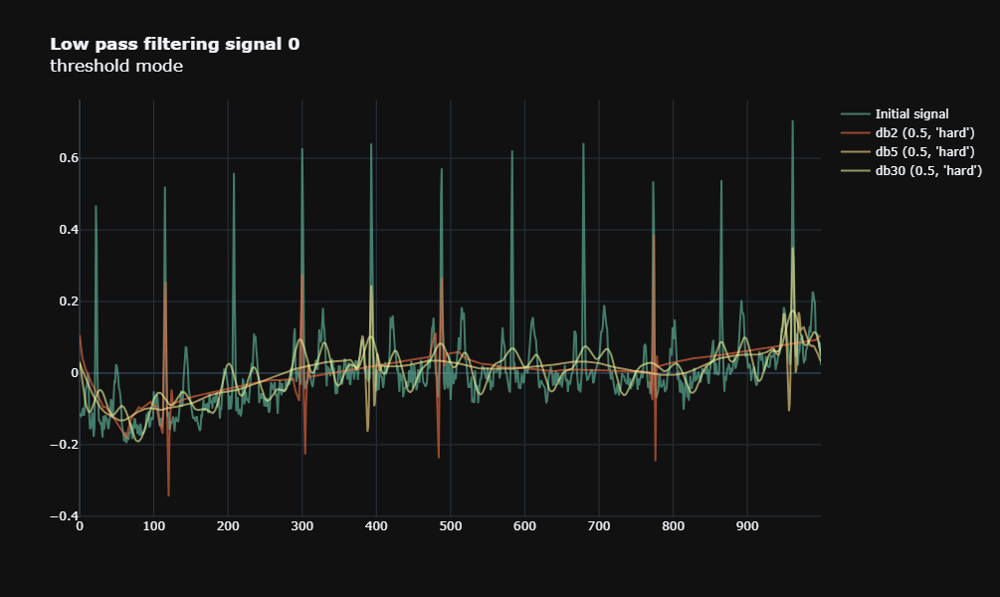

+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+
| Mother wavelet | Threshold value | Threshold method | Peak signal-to-noise ratio | Normalised MSE | Compression Ratio | Zero ratio Tun Moe | Entropy |
+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+
|      db2       |       0.5       |       hard       |            12.6            |      0.9       |       100.0       |        0.01        |   0.3   |
|      db5       |       0.5       |       hard       |            11.7            |      0.92      |        55.6       |        0.0         |   0.4   |
|      db30      |       0.5       |       hard       |            6.0             |      0.8       |        15.9       |        0.0         |   0.8   |
+----------------+-----------------+------------------+---------------------------

In [55]:
plot_wave_rec_lowpass(
    signal,
    ["db2", "db5", "db30"],
    [0.5],
    ["hard"]
)

Daubechies wavelets have the particularity of increasing regularity with their order, as with coiflettes and symmetrical wavelets. Unfortunately, this regularity is associated with a highly oscillating pattern, which in turn results in a more oscillating reconstruction analogous to Gibbs oscillations. In view of the signal we want to obtain (5 segments, 2 of which are not very regular), we're going to test low-order patterns.

After running various experiments, we found the most efficient orders for the daubechies, coiflet and symlet wavelets. Here is a representation of a denoising using each of them.

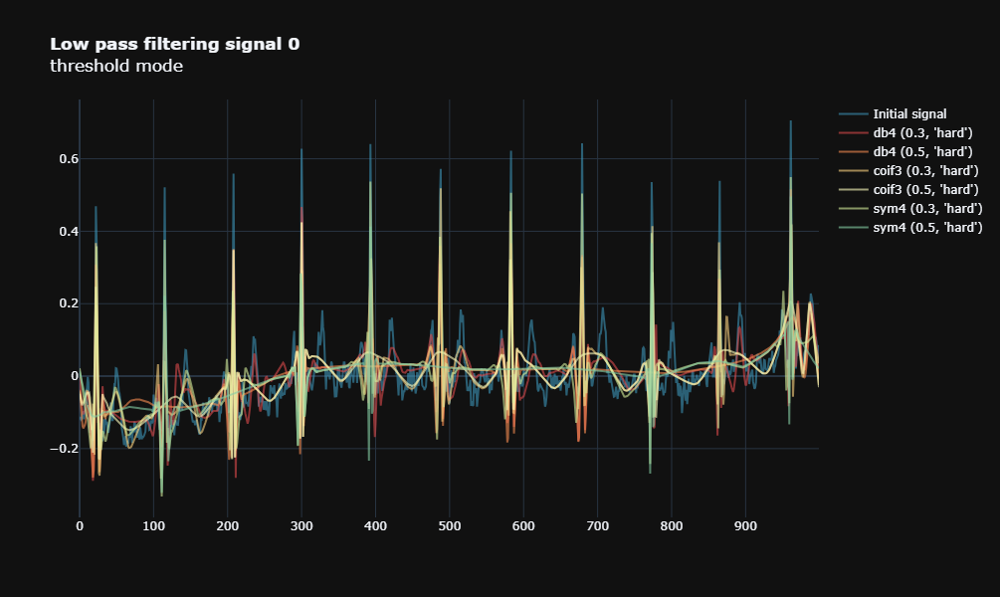

+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+
| Mother wavelet | Threshold value | Threshold method | Peak signal-to-noise ratio | Normalised MSE | Compression Ratio | Zero ratio Tun Moe | Entropy |
+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+
|      db4       |       0.3       |       hard       |            17.9            |      0.4       |        26.3       |        0.03        |   0.6   |
|      db4       |       0.5       |       hard       |            11.9            |      0.72      |        62.5       |        0.01        |   0.4   |
|     coif3      |       0.3       |       hard       |            18.0            |      0.4       |        18.2       |        0.02        |   0.8   |
|     coif3      |       0.5       |       hard       |            14.4           

In [56]:
plot_wave_rec_lowpass(
    signal,
    ["db4","coif3", "sym4"],
    np.linspace(0.3, 0.5, 2),
    ["hard"]
)

We have to admit that Daubechies' wavelets may not be the most relevant. Although the indicators are positive, we can see a more oscillating dynamic for the latter. It is confirmed by the rest of the data.

#### Soft thresholding

We will restrict the comparison to the mother wavelet selected through the study of the hard thresholding method. Indeed, our selection process gives better results for the same wavelets. You can plot additionnal graphs by adapting the following snippet using plot_wave_rec_low_pass function. The list of all wavelets can be found on the documentation of PyWavelets.

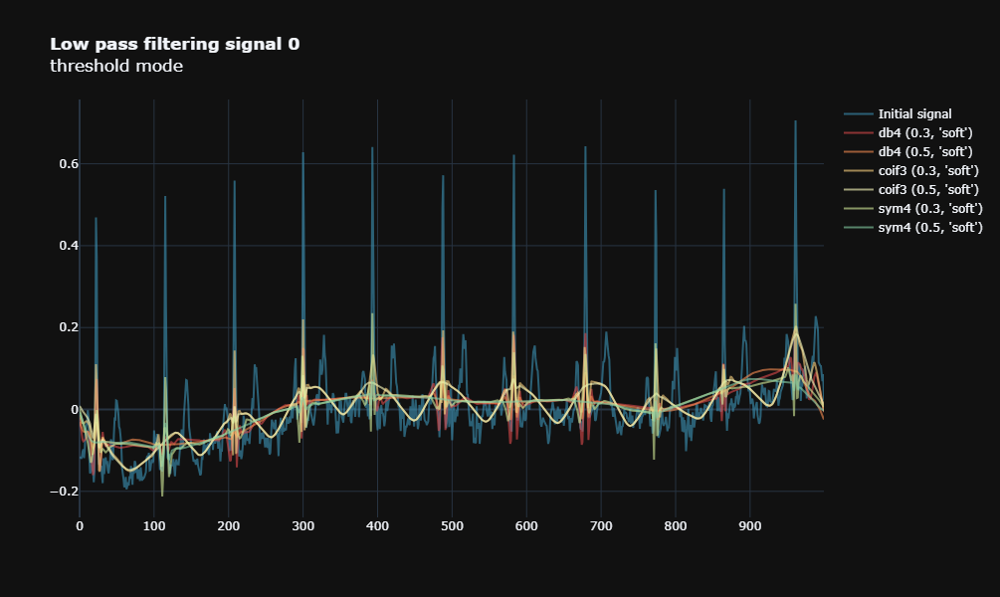

+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+
| Mother wavelet | Threshold value | Threshold method | Peak signal-to-noise ratio | Normalised MSE | Compression Ratio | Zero ratio Tun Moe | Entropy |
+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+
|      db4       |       0.3       |       soft       |            7.4             |      0.68      |        26.3       |        0.03        |   0.6   |
|      db4       |       0.5       |       soft       |            0.4             |      0.99      |        62.5       |        0.01        |   0.4   |
|     coif3      |       0.3       |       soft       |            8.8             |      0.62      |        18.2       |        0.02        |   0.7   |
|     coif3      |       0.5       |       soft       |            6.3            

In [57]:
plot_wave_rec_lowpass(
    signal,
    ["db4","coif3", "sym4"],
    np.linspace(0.3, 0.5, 2),
    ["soft"]
)

With the soft mode we've greatly smoothed out the small oscillations, which certainly increases the MSE but offers much better denoising. We will keep the two most competitive mother wavelets, the "coif3" and the "sym4".

In [61]:
print(df_signals.iloc[i,:])

ecg_id        1.000
channel-0    -0.116
channel-1    -0.051
channel-2     0.065
channel-3     0.083
channel-4    -0.090
channel-5     0.006
channel-6    -0.064
channel-7    -0.036
channel-8    -0.003
channel-9    -0.031
channel-10   -0.034
channel-11   -0.074
Name: 1, dtype: float64


In [68]:
print(np.unique(df_signals["ecg_id"]))

[    1     2     3 ... 21834 21835 21836]


Now, let's use these wavelet transform for denoising several signals of different patients suffering from different diseases. This way, we will see if our previous results can be generalised

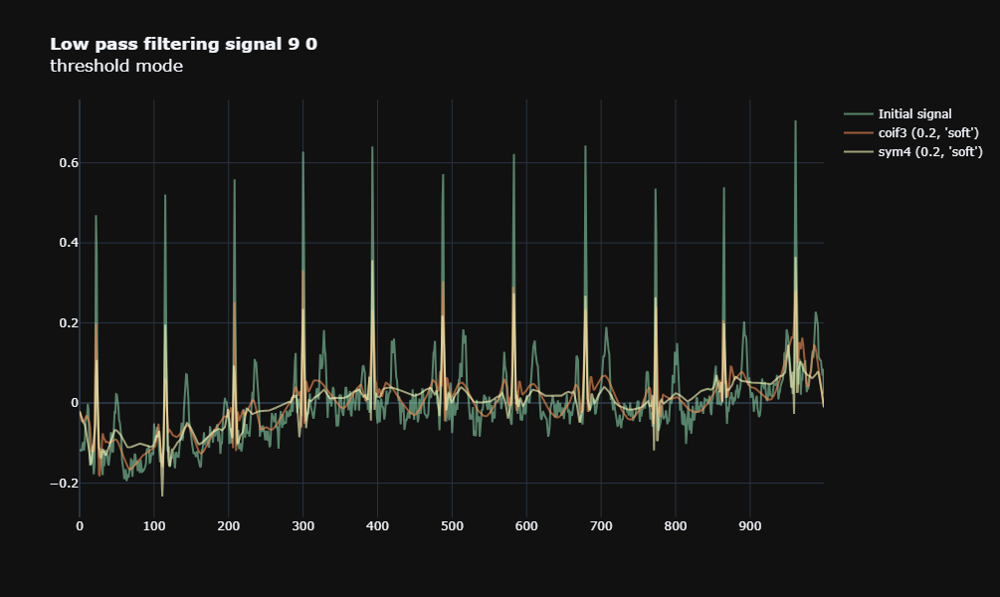

+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+
| Mother wavelet | Threshold value | Threshold method | Peak signal-to-noise ratio | Normalised MSE | Compression Ratio | Zero ratio Tun Moe | Entropy |
+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+
|     coif3      |       0.2       |       soft       |            14.0            |      0.38      |        10.9       |        0.06        |   1.1   |
|      sym4      |       0.2       |       soft       |            14.4            |      0.39      |        13.0       |        0.07        |   1.0   |
+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+


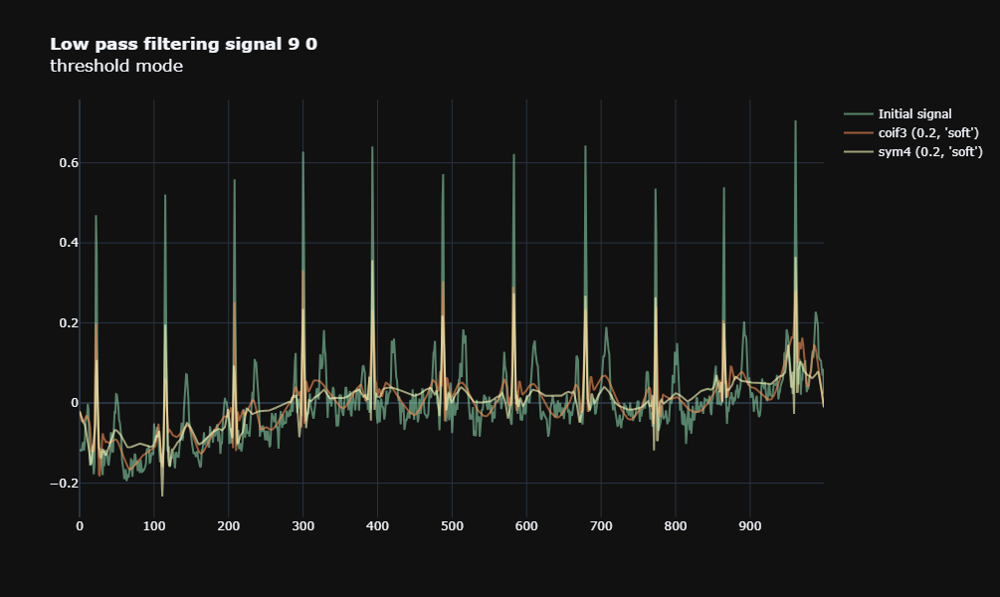

+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+
| Mother wavelet | Threshold value | Threshold method | Peak signal-to-noise ratio | Normalised MSE | Compression Ratio | Zero ratio Tun Moe | Entropy |
+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+
|     coif3      |       0.2       |       soft       |            14.0            |      0.38      |        10.9       |        0.06        |   1.1   |
|      sym4      |       0.2       |       soft       |            14.4            |      0.39      |        13.0       |        0.07        |   1.0   |
+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+


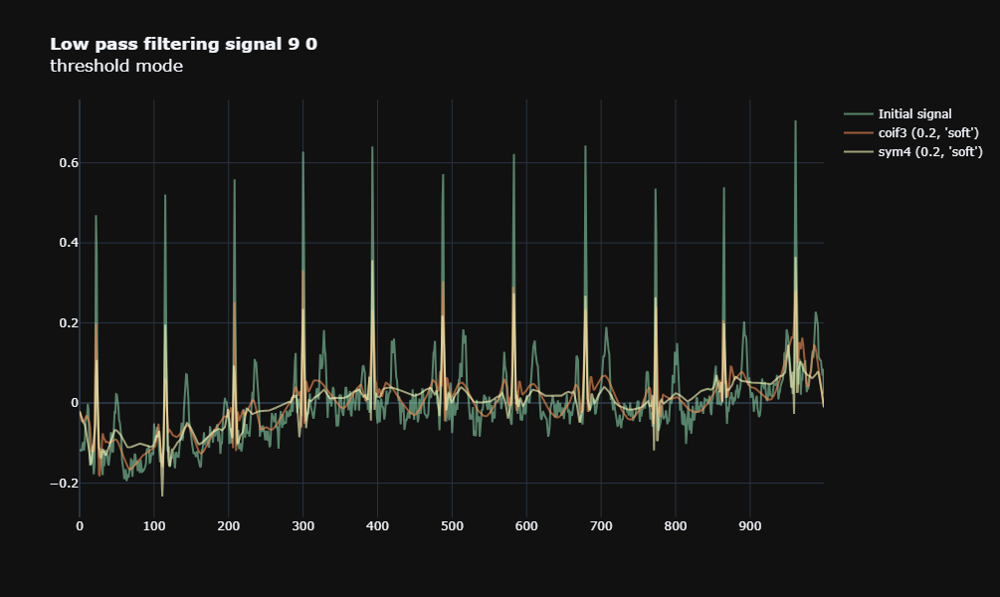

+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+
| Mother wavelet | Threshold value | Threshold method | Peak signal-to-noise ratio | Normalised MSE | Compression Ratio | Zero ratio Tun Moe | Entropy |
+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+
|     coif3      |       0.2       |       soft       |            14.0            |      0.38      |        10.9       |        0.06        |   1.1   |
|      sym4      |       0.2       |       soft       |            14.4            |      0.39      |        13.0       |        0.07        |   1.0   |
+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+


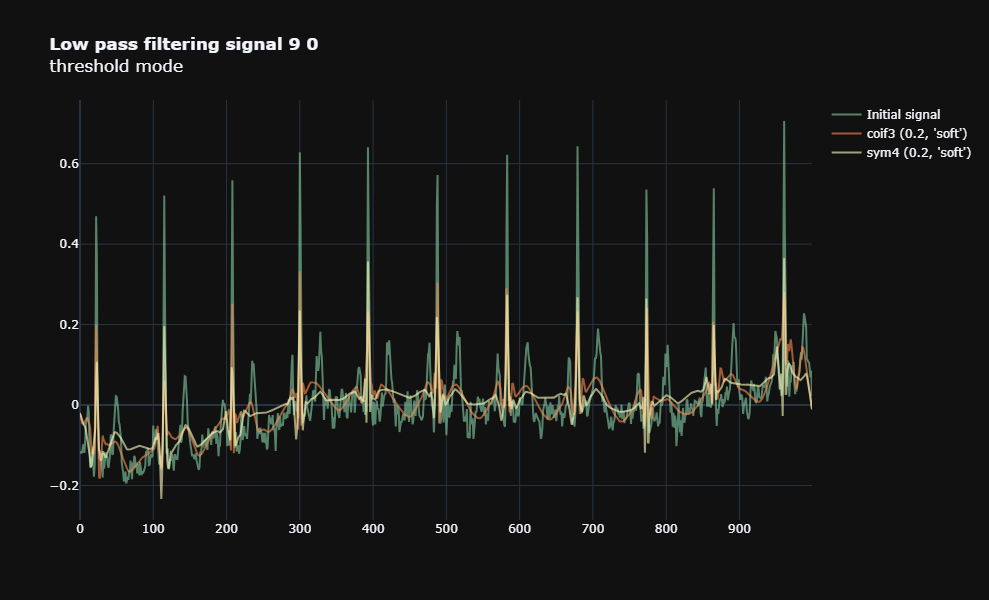

+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+
| Mother wavelet | Threshold value | Threshold method | Peak signal-to-noise ratio | Normalised MSE | Compression Ratio | Zero ratio Tun Moe | Entropy |
+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+
|     coif3      |       0.2       |       soft       |            14.0            |      0.38      |        10.9       |        0.06        |   1.1   |
|      sym4      |       0.2       |       soft       |            14.4            |      0.39      |        13.0       |        0.07        |   1.0   |
+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+


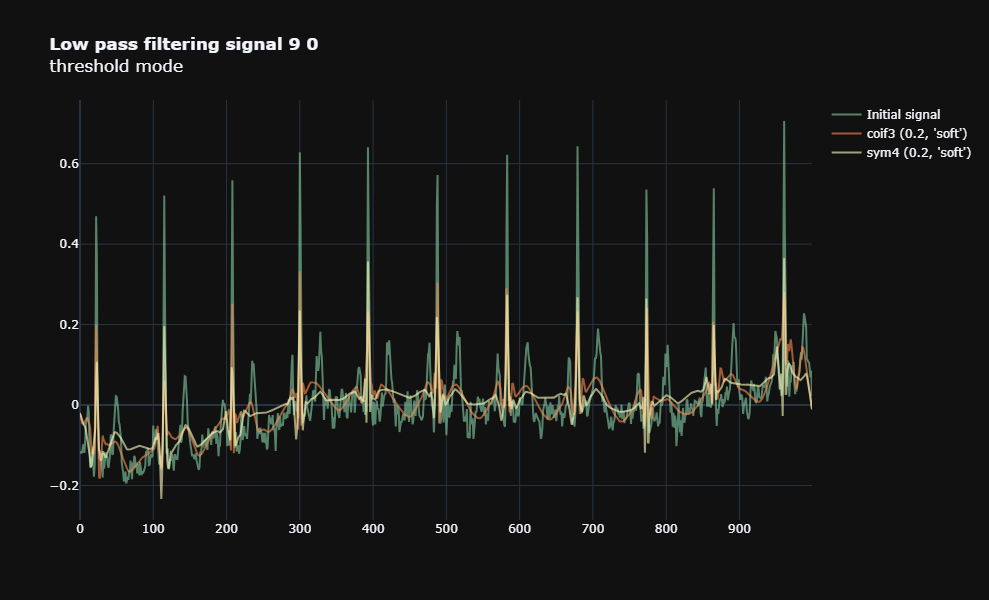

+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+
| Mother wavelet | Threshold value | Threshold method | Peak signal-to-noise ratio | Normalised MSE | Compression Ratio | Zero ratio Tun Moe | Entropy |
+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+
|     coif3      |       0.2       |       soft       |            14.0            |      0.38      |        10.9       |        0.06        |   1.1   |
|      sym4      |       0.2       |       soft       |            14.4            |      0.39      |        13.0       |        0.07        |   1.0   |
+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+


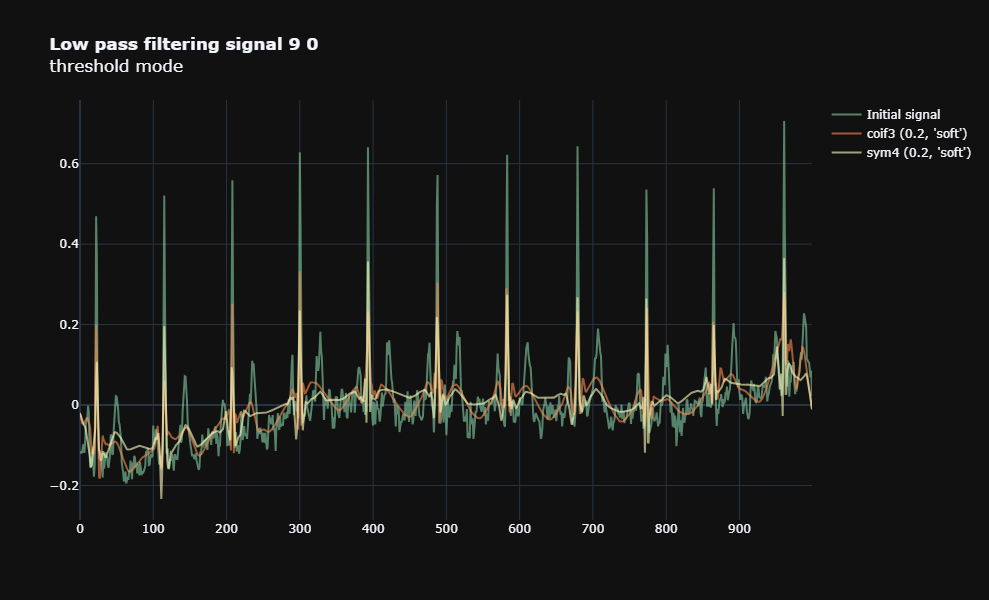

+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+
| Mother wavelet | Threshold value | Threshold method | Peak signal-to-noise ratio | Normalised MSE | Compression Ratio | Zero ratio Tun Moe | Entropy |
+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+
|     coif3      |       0.2       |       soft       |            14.0            |      0.38      |        10.9       |        0.06        |   1.1   |
|      sym4      |       0.2       |       soft       |            14.4            |      0.39      |        13.0       |        0.07        |   1.0   |
+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+


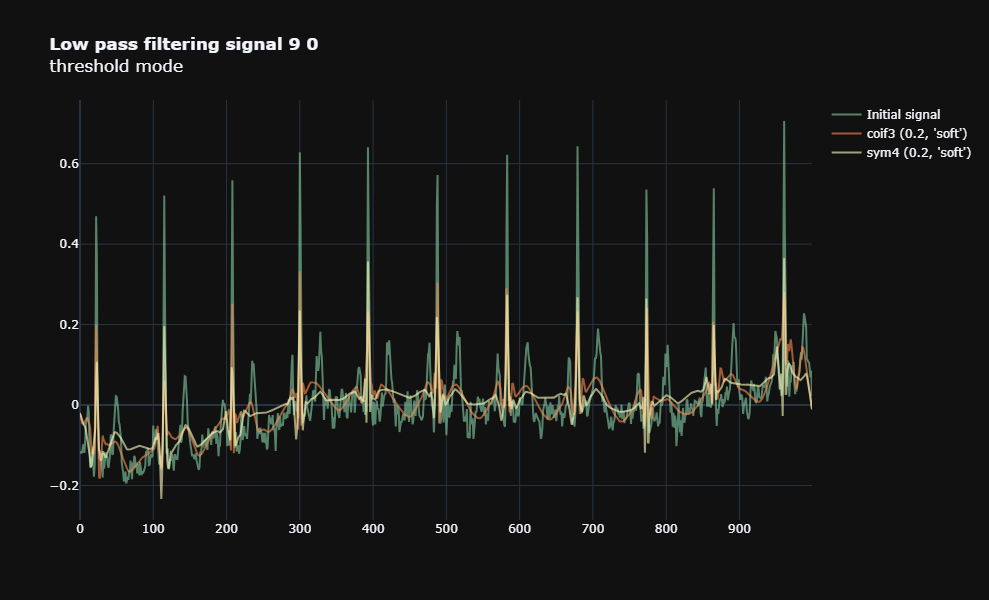

+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+
| Mother wavelet | Threshold value | Threshold method | Peak signal-to-noise ratio | Normalised MSE | Compression Ratio | Zero ratio Tun Moe | Entropy |
+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+
|     coif3      |       0.2       |       soft       |            14.0            |      0.38      |        10.9       |        0.06        |   1.1   |
|      sym4      |       0.2       |       soft       |            14.4            |      0.39      |        13.0       |        0.07        |   1.0   |
+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+


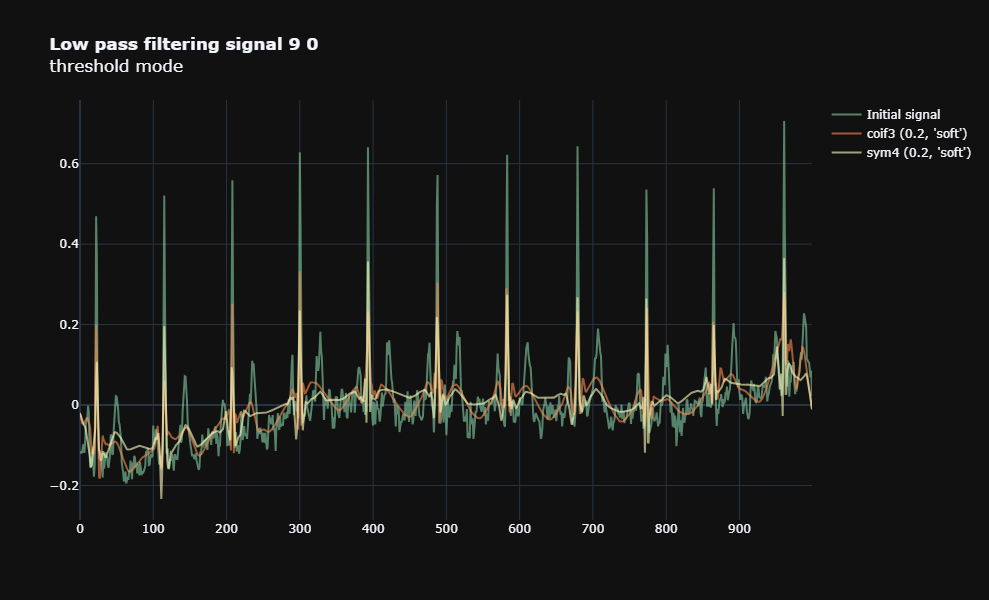

+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+
| Mother wavelet | Threshold value | Threshold method | Peak signal-to-noise ratio | Normalised MSE | Compression Ratio | Zero ratio Tun Moe | Entropy |
+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+
|     coif3      |       0.2       |       soft       |            14.0            |      0.38      |        10.9       |        0.06        |   1.1   |
|      sym4      |       0.2       |       soft       |            14.4            |      0.39      |        13.0       |        0.07        |   1.0   |
+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+


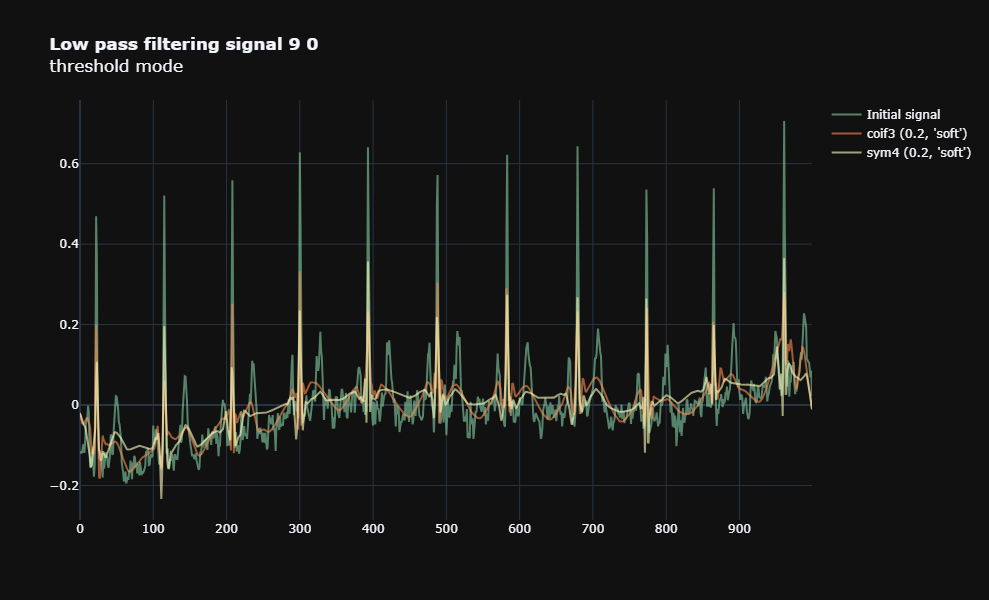

+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+
| Mother wavelet | Threshold value | Threshold method | Peak signal-to-noise ratio | Normalised MSE | Compression Ratio | Zero ratio Tun Moe | Entropy |
+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+
|     coif3      |       0.2       |       soft       |            14.0            |      0.38      |        10.9       |        0.06        |   1.1   |
|      sym4      |       0.2       |       soft       |            14.4            |      0.39      |        13.0       |        0.07        |   1.0   |
+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+


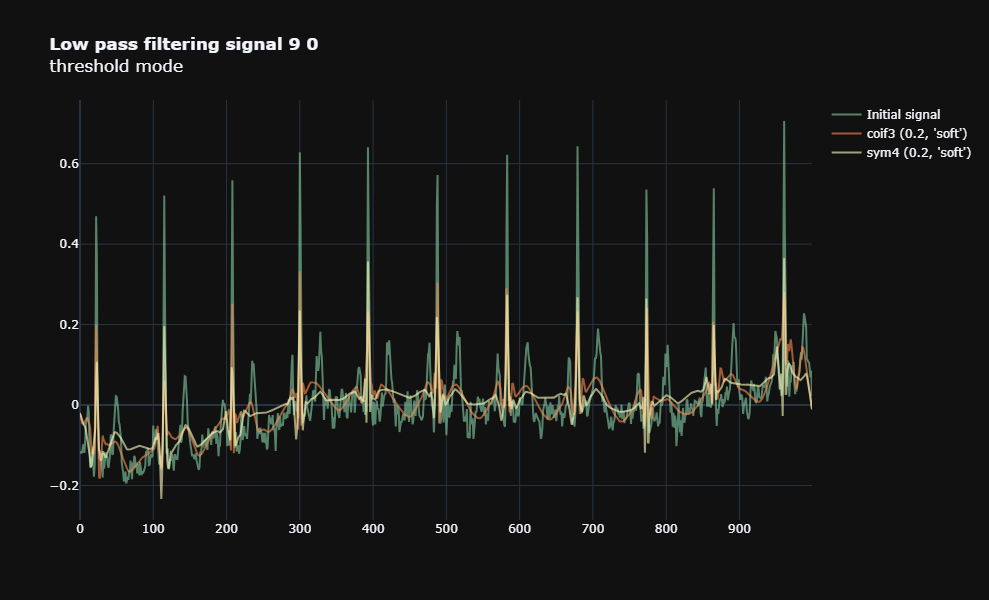

+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+
| Mother wavelet | Threshold value | Threshold method | Peak signal-to-noise ratio | Normalised MSE | Compression Ratio | Zero ratio Tun Moe | Entropy |
+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+
|     coif3      |       0.2       |       soft       |            14.0            |      0.38      |        10.9       |        0.06        |   1.1   |
|      sym4      |       0.2       |       soft       |            14.4            |      0.39      |        13.0       |        0.07        |   1.0   |
+----------------+-----------------+------------------+----------------------------+----------------+-------------------+--------------------+---------+


In [69]:
for id in df_signals["ecg_id"][:10]:
    diag = df_meta.iloc[i,9]
    plot_wave_rec_lowpass(
        df_signals.loc[df_signals["ecg_id"]==id,:].iloc[:,1],
        ["coif3","sym4"],
        [0.2],
        ["soft"],
        name = f"signal {i} {diag}"
    )

At the end of this first analysis, we have chosen rather conservative thresholds. Indeed, our objective is not compression, but diagnostic assistance.
"coif3" is a bit smoother than "sym4" but gives poorer approximations. If we had to choose a filter it would be **"sym4" in "soft" mode with a threshold of 0.2**.

#### Proximal denoising

Here, a proximal method is used to address an optimization problem where we minimize the MSE with a spasity penalty on the wavelet coefficients.
First we need to compute the proximal based on the regularization function. 

It is interesting to notice that the soft threshold is a specific case of a proximal method with norm 1 regularization. Thus, we interested in the comparison of the soft threshold and proximal method with other norm regularization.

In [70]:
def power_proximal(q, χ, ξ):
    """
    Compute the proximal of the power q function
    scaled to χ at point ξ
    
    Parameters
    ----------
    q : float
        Exponent in the power function
        Available: q = {1, 4/3, 3/2, 2, 3, 4}
        
    χ : float
        Regularization parameter
        
    ξ : float
        Point at which to compute the proximal operator
    
    Returns
    ---------
    prox : numpy.array
        Value of the proximal of the q power function
        at point ξ
    
    """
    Q_VALUES = [1.0, 4/3, 3/2, 2., 3., 4.]
    
    if q not in Q_VALUES:
        raise ValueError(f"q ({q}) does not belong in the expected "
                         f"values: {Q_VALUES}")
        
    prox = None
    
    if q == 1.0:
        prox = np.sign(ξ) * np.maximum(np.abs(ξ) - χ, 0)
    elif q == 4/3:
        ϵ = np.sqrt(ξ**2 + 256 / 729 * χ ** 3)
        prox = ξ + 4 * χ / (3 * 2 ** (1/3)) * ((ϵ - ξ) ** (1/3) - (ϵ + ξ) ** (1/3))
    elif q == 3/2:
        prox = ξ + 9 * χ ** 2 * np.sign(ξ) / 8 * (1 - np.sqrt(1 + 16 * np.abs(ξ) / (9 * χ ** 2)))
    elif q == 2:
        prox = ξ / (1 + 2 * χ)                    
    elif q == 3.:
        prox = np.sign(ξ) * (np.sqrt(1 + 12 * χ * np.abs(ξ)) - 1) / (6 * χ)
    elif q == 4.:
        ϵ = np.sqrt(ξ ** 2 + 1 / (27 * χ))
        prox = ((ϵ + ξ) / (8 * χ)) ** (1/3) - ((ϵ - ξ) / (8 * χ)) ** (1/3)
        
    return prox

def my_prox(coeff, arg0, arg1):
    return power_proximal(arg0, arg1, coeff)

def plot_wave_rec_prox(sign, waves, exponents, reg_parameters, name = "signal 0"):
    lst_args = list(product(waves, exponents, reg_parameters))
    table2 = PrettyTable([
        "Mother wavelet", 
        "Regul Exponent", 
        "Regul Parameter", 
        "Peak signal-to-noise ratio", 
        "Normalised MSE", 
        "Compression Ratio",
        "Zero ratio Tun Moe",
        "Entropy"
    ])
    plot_wave_rec(
        sign,
        lst_args, 
        title = f"<b>Proximal filtering {name}</b><br>Exponent regularization-parameter", 
        f_filter = my_prox,
        table = table2
    )
       

Thanks to certain properties of the proximal, the optimum is reached when the proximal is applied to each of the coefficients before reconstruction. Note that this is analogous to a filtering method.

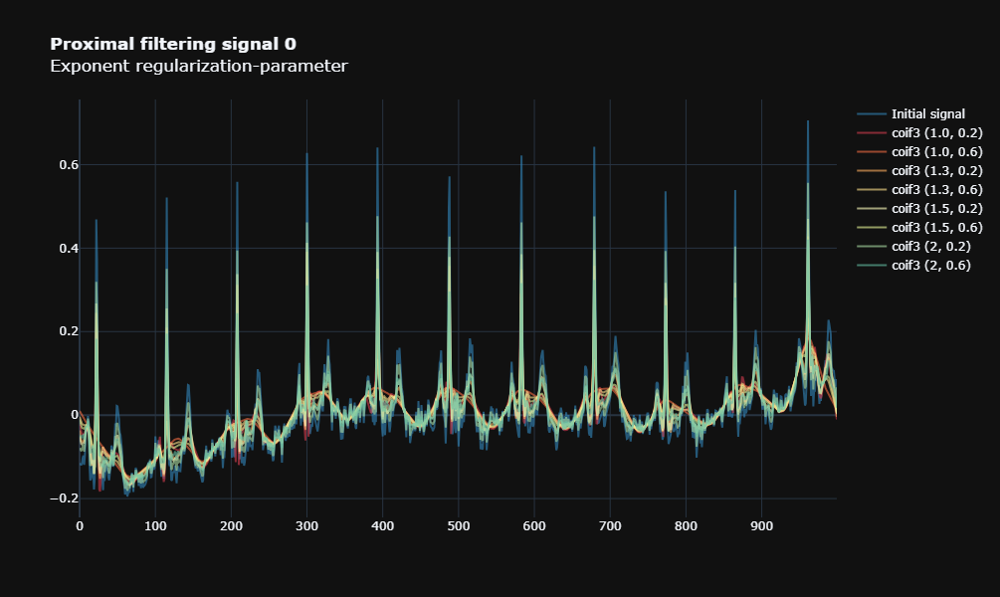

+----------------+----------------+-----------------+----------------------------+----------------+-------------------+--------------------+---------+
| Mother wavelet | Regul Exponent | Regul Parameter | Peak signal-to-noise ratio | Normalised MSE | Compression Ratio | Zero ratio Tun Moe | Entropy |
+----------------+----------------+-----------------+----------------------------+----------------+-------------------+--------------------+---------+
|     coif3      |      1.0       |       0.2       |            14.0            |      0.38      |        10.9       |        0.06        |   1.1   |
|     coif3      |      1.0       |       0.6       |            6.1             |      0.89      |        31.2       |        0.0         |   0.5   |
|     coif3      |      1.3       |       0.2       |            18.9            |      0.16      |        1.0        |        1.0         |   2.0   |
|     coif3      |      1.3       |       0.6       |            9.3             |      0.61  

In [71]:
plot_wave_rec_prox(
    signal,
    ["coif3"],
    [1.0, 4/3, 3/2,2],
    np.linspace(2e-1, 6e-1, 2)
)

Regularizations by p-norme with p greater than 4/3 are not parsimonious enough to eliminate noise. And this remains true even with a high regularization parameter. An exponent of 1 seems to be the best choice to have avoid small oscillations. Note that the proximal for this exponent is the threshold function in soft mode. Moreover, we can see that the compression ratios are all equals to one for regulation exponents higher than 1. This is due to the fact that for these exponents, the proximal method do not set values to 0. Hence, for regularisation exponents higher than 1, this method cannot be used for a data compression purpose. Indeed, we are interested in this method for the  denoising task. However, we can see that for regulation exponents higher than one, the reconstructed signal is less smooth and the pattern we seek is less recognisable. We conclude that the proximal method provide its best results for the denoising task and the compression task for the $L^1$ norm, which matches the soft thresholding method. Thus, the overall best method for denoising an ECG for diagnostic analysis is the soft thresholding method with a Symlet4 mother wavelet and a threshold value of ~0.2.

#### Scalograme interpretations

Additionally, we can try to compare the soft thresholding and optimal proximal methods with their scalograms. 

In [86]:
def best_denoised(sign, f_filter):
    #decomposition
    coeffs = pywt.wavedec(sign, "sym4", mode="per")
    #filtration
    if f_filter.__name__ == "my_prox":
        args_filter = (1,0.2)
    else:
        print(f_filter.__name__)
        args_filter = (0.2,"soft")
    
    coeffs[1:] = (f_filter(coeff, *args_filter) for coeff in coeffs[1:])
    #reconstruction
    return pywt.waverec(coeffs, "sym4", mode="per" )

def plot_scalogram_best_denoised(sign, scales):
    f_plot = lambda sig, title: plot_scalogram_freq(
        sig, 
        scales, 
        waveletname = 'cmor', 
        title = title, 
        levels = np.linspace(5e-3, 1, 40)
    )
    f_plot(sign, f"Scalograme original signal")
    f_plot(best_denoised(sign, my_threshold), f"Scalograme soft threshold sym4 (0.2)")
    f_plot(best_denoised(sign, my_prox), f"Scalograme proximal sym4 (1 0.2)")

C:\Users\samud\anaconda3\envs\MVA2\lib\site-packages\pywt\_cwt.py:117: FutureWarning:

Wavelets from the family cmor, without parameters specified in the name are deprecated. The name should takethe form cmorB-C where B and C are floats representing the bandwidth frequency and center frequency, respectively (example: cmor1.5-1.0).



<Figure size 640x480 with 0 Axes>

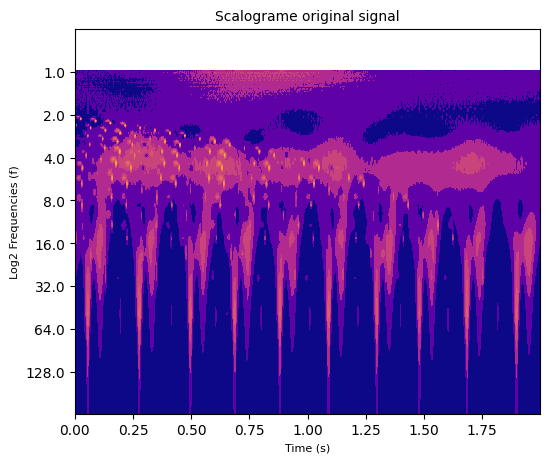

my_threshold


C:\Users\samud\anaconda3\envs\MVA2\lib\site-packages\pywt\_cwt.py:117: FutureWarning:

Wavelets from the family cmor, without parameters specified in the name are deprecated. The name should takethe form cmorB-C where B and C are floats representing the bandwidth frequency and center frequency, respectively (example: cmor1.5-1.0).



<Figure size 640x480 with 0 Axes>

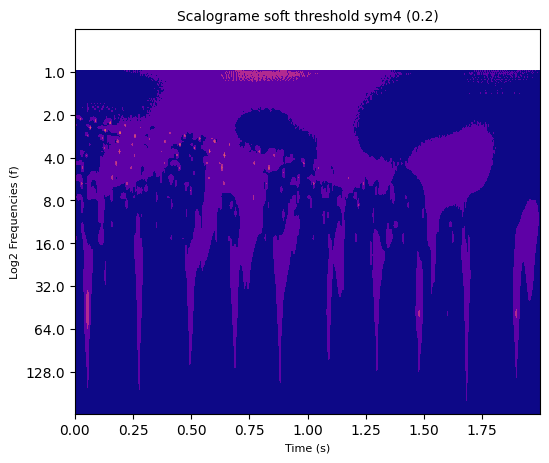

C:\Users\samud\anaconda3\envs\MVA2\lib\site-packages\pywt\_cwt.py:117: FutureWarning:

Wavelets from the family cmor, without parameters specified in the name are deprecated. The name should takethe form cmorB-C where B and C are floats representing the bandwidth frequency and center frequency, respectively (example: cmor1.5-1.0).



<Figure size 640x480 with 0 Axes>

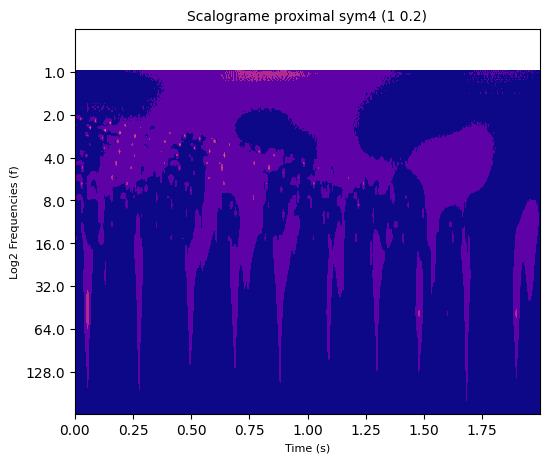

In [87]:
plot_scalogram_best_denoised(df_signals.loc[df_signals["ecg_id"]==42,:].iloc[:,1], scales )

The scalograms confirms the fact that our two selectioned approaches are exactly the same. The high-frequency structures are not associated with noise but the main peaks. It's mainly the values around the singularities that make up the noise.

## Appendix Wavelets

### Wavelets mothers and fathers

You can plot the different wavelets implemented in the library PyWavelets with the following code. We didn't run it cause it would increase very much the weight of the file. Indeed, it will plot all the mother wavelet of the PyWavelet library.

In [ ]:
level = 5

lst_types = pywt.families()
sep_continous = lst_types.index("gaus")

lst_discret = lst_types[:sep_continous]
lst_continuous = lst_types[sep_continous:]

for type in lst_discret:
    plot_wave_family(level, type, iscontinous = False)
    
for type in lst_continuous:
    plot_wave_family(level, type, iscontinous = True)

### Discrete Wavelet Transform

The following code can be used to test the discrete wavelet transform for some mother wavelets. We provide a test for the mother wavelet Daubechies 2.

In [6]:
approx, detail = pywt.dwt(signal, 'db2')

plot_signal(approx, title = "Approximation coefficients")
plot_signal(detail, title = "Details coefficients")

In [7]:
plot_reconstruct = lambda app, det, title: plot_estim(pywt.idwt(app, det, 'db2'), signal, title = title)

plot_reconstruct(approx, detail, "reconstruction")
plot_reconstruct(approx, np.zeros_like(detail), "reconstruction without details")
plot_reconstruct(np.zeros_like(approx), detail, "reconstruction without approx")

The next snippet plot the evolution of the approximation of the signal 0 when we add detail coefficients one by one. The singluar form of the Haar wavelet enables us to see the impact of the mother wavelet on the recomposition. 

In [8]:
w = pywt.DiscreteContinuousWavelet("haar")
plot_decomposition(w, title=f"Wavelets multilevel reconstruction")